# **Configuration Colabs dan download dataset**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content/drive/My Drive/Dataset/Kaggle"

In [ ]:
#changing the working directory
%cd /content/drive/My Drive/Dataset/Kaggle

/content/drive/My Drive/Dataset/Kaggle


In [ ]:
!kaggle datasets download -d nicholasjhana/energy-consumption-generation-prices-and-weather

  0% 0.00/3.81M [00:00<?, ?B/s]
100% 3.81M/3.81M [00:00<00:00, 62.1MB/s]


In [ ]:
!unzip energy-consumption-generation-prices-and-weather.zip -d '/content/drive/My Drive/Dicoding/Submission_2/dataset'

Archive:  energy-consumption-generation-prices-and-weather.zip
  inflating: /content/drive/My Drive/Dicoding/Submission_2/dataset/energy_dataset.csv  
  inflating: /content/drive/My Drive/Dicoding/Submission_2/dataset/weather_features.csv  


# **Import Library**

In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import plotly.graph_objects as go

from livelossplot import PlotLossesKeras
from sklearn.preprocessing import MinMaxScaler
from keras.preprocessing.sequence import TimeseriesGenerator

# **Preparing Data**

In [ ]:
dataset = '/content/drive/My Drive/Dicoding/Submission_2/dataset/energy_dataset.csv'
df = pd.read_csv(dataset)

In [ ]:
display(df.head())
print(df.shape)

,time,generation biomass,generation fossil brown coal/lignite,generation fossil coal-derived gas,generation fossil gas,generation fossil hard coal,generation fossil oil,generation fossil oil shale,generation fossil peat,generation geothermal,generation hydro pumped storage aggregated,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation marine,generation nuclear,generation other,generation other renewable,generation solar,generation waste,generation wind offshore,generation wind onshore,forecast solar day ahead,forecast wind offshore eday ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual
0,2015-01-01 00:00:00+01:00,447.0,329.0,0.0,4844.0,4821.0,162.0,0.0,0.0,0.0,NaN,863.0,1051.0,1899.0,0.0,7096.0,43.0,73.0,49.0,196.0,0.0,6378.0,17.0,NaN,6436.0,26118.0,25385.0,50.10,65.41
1,2015-01-01 01:00:00+01:00,449.0,328.0,0.0,5196.0,4755.0,158.0,0.0,0.0,0.0,NaN,920.0,1009.0,1658.0,0.0,7096.0,43.0,71.0,50.0,195.0,0.0,5890.0,16.0,NaN,5856.0,24934.0,24382.0,48.10,64.92
2,2015-01-01 02:00:00+01:00,448.0,323.0,0.0,4857.0,4581.0,157.0,0.0,0.0,0.0,NaN,1164.0,973.0,1371.0,0.0,7099.0,43.0,73.0,50.0,196.0,0.0,5461.0,8.0,NaN,5454.0,23515.0,22734.0,47.33,64.48
3,2015-01-01 03:00:00+01:00,438.0,254.0,0.0,4314.0,4131.0,160.0,0.0,0.0,0.0,NaN,1503.0,949.0,779.0,0.0,7098.0,43.0,75.0,50.0,191.0,0.0,5238.0,2.0,NaN,5151.0,22642.0,21286.0,42.27,59.32
4,2015-01-01 04:00:00+01:00,428.0,187.0,0.0,4130.0,3840.0,156.0,0.0,0.0,0.0,NaN,1826.0,953.0,720.0,0.0,7097.0,43.0,74.0,42.0,189.0,0.0,4935.0,9.0,NaN,4861.0,21785.0,20264.0,38.41,56.04


(35064, 29)


In [ ]:
dates = pd.date_range(start='2015-01-01', end='2018-12-31 2300', freq='H')
df['time'] = pd.DatetimeIndex(dates).tz_localize('UTC').tz_convert('Europe/Madrid')
df = df.set_index('time')
df.head()

,generation biomass,generation fossil brown coal/lignite,generation fossil coal-derived gas,generation fossil gas,generation fossil hard coal,generation fossil oil,generation fossil oil shale,generation fossil peat,generation geothermal,generation hydro pumped storage aggregated,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation marine,generation nuclear,generation other,generation other renewable,generation solar,generation waste,generation wind offshore,generation wind onshore,forecast solar day ahead,forecast wind offshore eday ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual
time,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2015-01-01 01:00:00+01:00,447.0,329.0,0.0,4844.0,4821.0,162.0,0.0,0.0,0.0,NaN,863.0,1051.0,1899.0,0.0,7096.0,43.0,73.0,49.0,196.0,0.0,6378.0,17.0,NaN,6436.0,26118.0,25385.0,50.10,65.41
2015-01-01 02:00:00+01:00,449.0,328.0,0.0,5196.0,4755.0,158.0,0.0,0.0,0.0,NaN,920.0,1009.0,1658.0,0.0,7096.0,43.0,71.0,50.0,195.0,0.0,5890.0,16.0,NaN,5856.0,24934.0,24382.0,48.10,64.92
2015-01-01 03:00:00+01:00,448.0,323.0,0.0,4857.0,4581.0,157.0,0.0,0.0,0.0,NaN,1164.0,973.0,1371.0,0.0,7099.0,43.0,73.0,50.0,196.0,0.0,5461.0,8.0,NaN,5454.0,23515.0,22734.0,47.33,64.48
2015-01-01 04:00:00+01:00,438.0,254.0,0.0,4314.0,4131.0,160.0,0.0,0.0,0.0,NaN,1503.0,949.0,779.0,0.0,7098.0,43.0,75.0,50.0,191.0,0.0,5238.0,2.0,NaN,5151.0,22642.0,21286.0,42.27,59.32
2015-01-01 05:00:00+01:00,428.0,187.0,0.0,4130.0,3840.0,156.0,0.0,0.0,0.0,NaN,1826.0,953.0,720.0,0.0,7097.0,43.0,74.0,42.0,189.0,0.0,4935.0,9.0,NaN,4861.0,21785.0,20264.0,38.41,56.04


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 35064 entries, 2015-01-01 01:00:00+01:00 to 2019-01-01 00:00:00+01:00
Freq: H
Data columns (total 28 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   generation biomass                           35045 non-null  float64
 1   generation fossil brown coal/lignite         35046 non-null  float64
 2   generation fossil coal-derived gas           35046 non-null  float64
 3   generation fossil gas                        35046 non-null  float64
 4   generation fossil hard coal                  35046 non-null  float64
 5   generation fossil oil                        35045 non-null  float64
 6   generation fossil oil shale                  35046 non-null  float64
 7   generation fossil peat                       35046 non-null  float64
 8   generation geothermal                        35046 non-null  float64
 9   generation hydro 

In [ ]:
df.isin([0]).sum()

generation biomass                                 4
generation fossil brown coal/lignite           10517
generation fossil coal-derived gas             35046
generation fossil gas                              1
generation fossil hard coal                        3
generation fossil oil                              3
generation fossil oil shale                    35046
generation fossil peat                         35046
generation geothermal                          35046
generation hydro pumped storage aggregated         0
generation hydro pumped storage consumption    12607
generation hydro run-of-river and poundage         3
generation hydro water reservoir                   3
generation marine                              35045
generation nuclear                                 3
generation other                                   4
generation other renewable                         3
generation solar                                   3
generation waste                              

Menghapus kolom yang memiliki nilai zero terbanyak dan nilai Nan. 
Serta menghapus nilai forecast yang telah dilakukan oleh penyedia data.

In [ ]:
df_new = df.drop(['generation hydro pumped storage aggregated', 'forecast wind offshore eday ahead', 
                     'generation fossil brown coal/lignite', 'generation fossil coal-derived gas', 
                     'generation fossil oil shale', 'generation fossil peat', 'generation geothermal', 
                     'generation hydro pumped storage consumption', 'generation marine', 
                     'generation wind offshore', 'forecast solar day ahead', 'forecast wind offshore eday ahead', 
                     'forecast wind onshore day ahead', 'total load forecast', 'price day ahead'], 
                    axis=1)


In [ ]:
df_new.isnull().sum()

generation biomass                            19
generation fossil gas                         18
generation fossil hard coal                   18
generation fossil oil                         19
generation hydro run-of-river and poundage    19
generation hydro water reservoir              18
generation nuclear                            17
generation other                              18
generation other renewable                    18
generation solar                              18
generation waste                              19
generation wind onshore                       18
total load actual                             36
price actual                                   0
dtype: int64

In [ ]:
df_new.interpolate(method='linear', limit_direction='forward', inplace=True, axis=0)

In [ ]:
df_new.isnull().sum()

generation biomass                            0
generation fossil gas                         0
generation fossil hard coal                   0
generation fossil oil                         0
generation hydro run-of-river and poundage    0
generation hydro water reservoir              0
generation nuclear                            0
generation other                              0
generation other renewable                    0
generation solar                              0
generation waste                              0
generation wind onshore                       0
total load actual                             0
price actual                                  0
dtype: int64

# **Time Series Analysis**

## Visulization Original Data

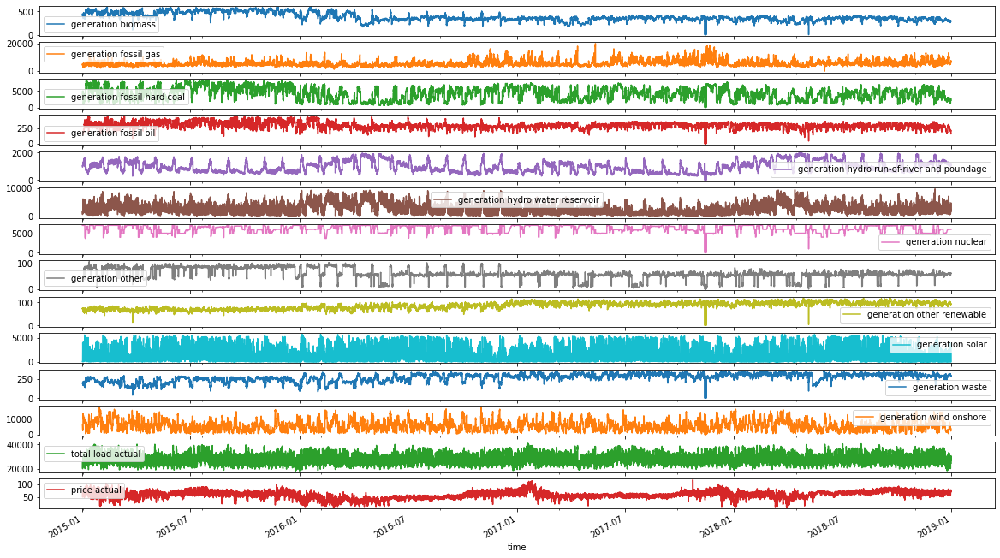

In [ ]:
df_new[df_new.columns.to_list()].plot(subplots=True, figsize=(20, 12))
plt.show()

## Visualization 30Day Rolling

In [ ]:
df_new = df_new.rolling('30D').mean()

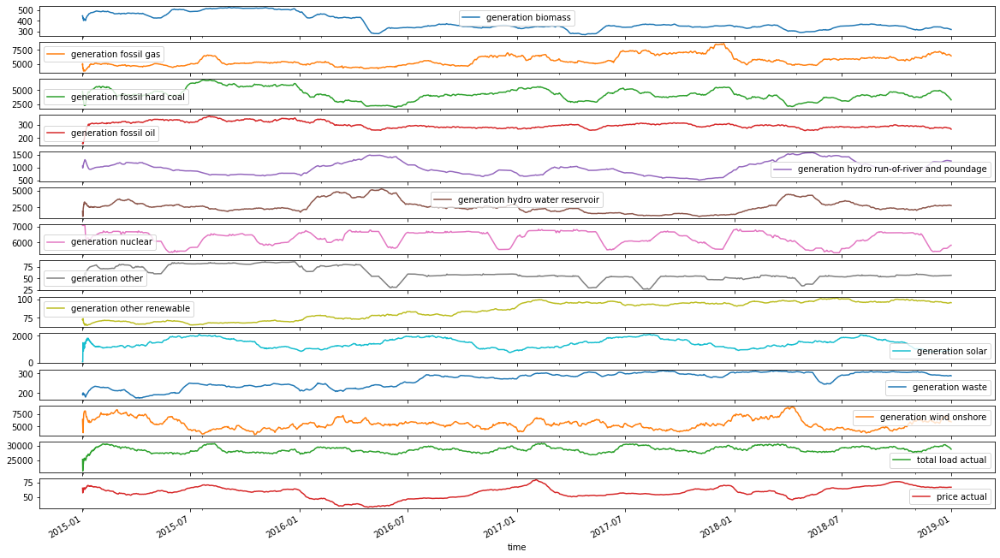

In [ ]:
df_new[df_new.columns.to_list()].plot(subplots=True, figsize=(20, 12))
plt.show()

## Melihat Korelasi antar kolom

In [ ]:
correlations = df_new.corr(method='pearson') 
print(correlations['price actual'].sort_values(ascending=False).to_string())


price actual                                  1.000000
generation fossil hard coal                   0.647933
generation fossil gas                         0.531868
generation waste                              0.263851
generation other renewable                    0.247161
total load actual                             0.231042
generation fossil oil                         0.139926
generation biomass                            0.137140
generation other                              0.095940
generation solar                             -0.102407
generation nuclear                           -0.126170
generation wind onshore                      -0.257428
generation hydro run-of-river and poundage   -0.397222
generation hydro water reservoir             -0.563982


In [ ]:
col_del = correlations['price actual'].sort_values(ascending=False).index.to_list()[3:12]
# Menghapus Kolom yang nilai korelasinya kecil
df_new = df_new.drop(col_del, axis=1)


In [ ]:
correlations = df_new.corr(method='pearson') 
print(correlations['price actual'].sort_values(ascending=False).to_string())


price actual                                  1.000000
generation fossil hard coal                   0.647933
generation fossil gas                         0.531868
generation hydro run-of-river and poundage   -0.397222
generation hydro water reservoir             -0.563982


In [ ]:
fig = go.Figure(data=go.Heatmap(
                    z=correlations,
                    x=correlations.index,
                    y=correlations.columns,
                    hoverongaps = False))
fig.show()

# **Split Data**

In [ ]:
index_split = df_new.shape[0]*80//100

# Split Data
data_train = df_new[:index_split].values
data_test = df_new[index_split:].values

# Split Tanggal
date_train = df_new[:index_split].index
date_test = df_new[index_split:].index

Normalization

In [ ]:
scaler_train = MinMaxScaler(feature_range=(0, 1))
scaler_test = MinMaxScaler(feature_range=(0, 1))

scaler_train.fit(data_train)
scaler_test.fit(data_test)

data_train_norm = scaler_train.transform(data_train)
data_test_norm = scaler_test.transform(data_test)


In [ ]:
look_back = 15

train_generator = TimeseriesGenerator(data_train_norm, data_train_norm, length=look_back, batch_size=20)     
test_generator = TimeseriesGenerator(data_test_norm, data_test_norm, length=look_back, batch_size=1)

# **Build Model**

In [ ]:
model = tf.keras.models.Sequential([
  tf.keras.layers.Bidirectional(
      tf.keras.layers.LSTM(100, return_sequences=True, activation='relu'), input_shape=(look_back,5)),
  tf.keras.layers.LSTM(50, activation='relu'),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(128, activation='relu'),
  tf.keras.layers.Dense(64, activation='relu'),
  tf.keras.layers.Dropout(0.1),
  tf.keras.layers.Dense(5)
])

In [ ]:
loss = tf.keras.losses.Huber()
lr_schedule = tf.keras.callbacks.LearningRateScheduler(
              lambda epoch: 1e-4 * 10**(epoch / 10))

optimizer = tf.keras.optimizers.Adam(lr=6e-3, amsgrad=True)

model.compile(loss=loss, optimizer=optimizer, metrics=["mae"])


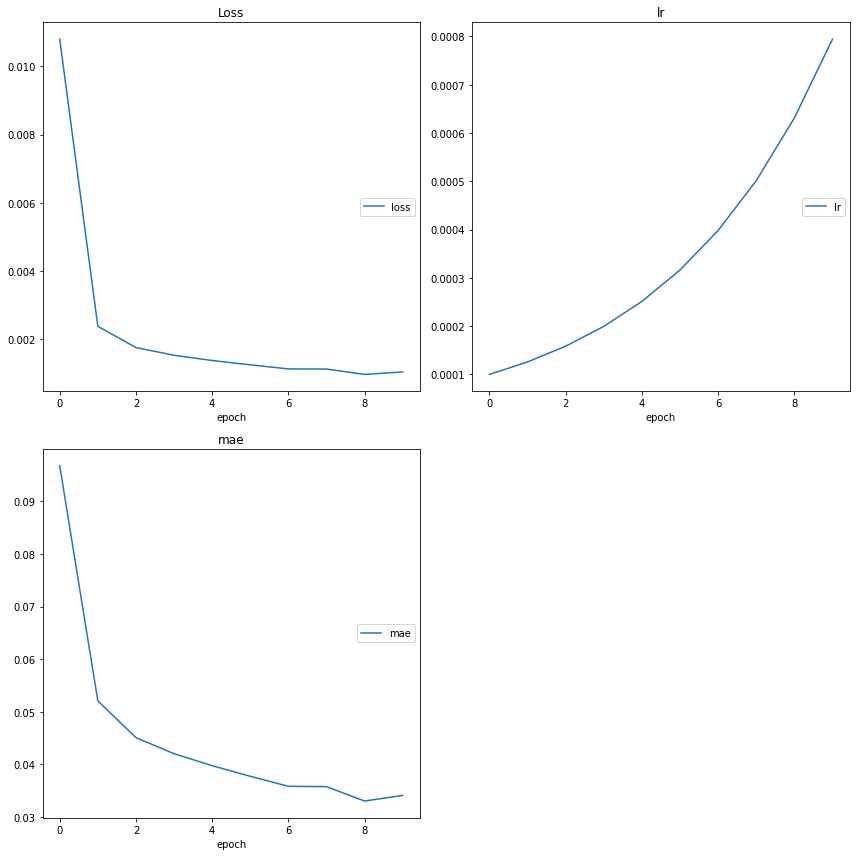

Loss
	loss             	 (min:    0.001, max:    0.011, cur:    0.001)
lr
	lr               	 (min:    0.000, max:    0.001, cur:    0.001)
mae
	mae              	 (min:    0.033, max:    0.097, cur:    0.034)
1402/1402 [==============================] - 44s 31ms/step - loss: 0.0010 - mae: 0.0341


In [ ]:
history = model.fit_generator(train_generator, epochs=10, 
                              callbacks=[lr_schedule, PlotLossesKeras()])

# **Evaluasi Model**

In [ ]:
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.round(np.mean(np.abs((y_true - y_pred) / y_true)) * 100, 2)

In [ ]:
prediction = model.predict_generator(test_generator)
pred = scaler_test.inverse_transform(prediction)

In [ ]:
print('Mean Absolute Percetage Error : {}%'.format(mean_absolute_percentage_error(data_test[15:], pred)))

Mean Absolute Percetage Error : 1.53%


In [ ]:
df_new.columns.to_list()

['generation fossil gas',
 'generation fossil hard coal',
 'generation hydro run-of-river and poundage',
 'generation hydro water reservoir',
 'price actual']

In [ ]:
def plot_forecast(kolom, title):
  data_vis = go.Scatter(
    x = date_train,
    y = data_train[:, kolom],
    mode = 'lines',
    name = 'Data'
  )
  pred_vis = go.Scatter(
    x = date_test[15:],
    y = pred[:, kolom],
    mode = 'lines',
    name = 'Prediction'
  )
  test_vis = go.Scatter(
    x = date_test,
    y = data_test[:, kolom],
    mode='lines',
    name = 'True'
  )
  layout = go.Layout(
    title = title,
    xaxis = {'title' : "Time"},
    yaxis = {'title' : "Value"}
  )
  fig = go.Figure(data=[data_vis, pred_vis, test_vis], layout=layout)
  fig.show()


In [ ]:
title = df_new.columns.to_list()
for i in range(len(title)):
  plot_forecast(i, title[i])